<font face="B Mitra" size=4>
<div dir=rtl align=center>

<br>
<img src="https://aut.ac.ir/templates/tmpl_modern01/images/logo_fa.png" alt="Amirkabir University Logo" width="100">

<br>
<font size=2>
<b>دانشگاه صنعتی امیرکبیر - دانشکده ریاضی و علوم کامپیوتر</b>
</font>

<br>
<font size=6>
<b>گرافیک کامپیوتری</b>
</font>
<br>
استاد: دکتر مصطفی شمسی

<br>
طراحان:‌ امین حسین سیدقلعه و مهدی غیاثی
<hr/>
<font size=6>
<b>تمرین دوم</b>
</font>



<hr>
</div>
</font>


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
لطفا فایل نوت بوک نهایی را با الگوی زیر در سامانه کورسز آپلود کنید.
</font>
</p>

<div dir=ltr>
<font face="Times New Roman" size=4 dir=ltr>
شماره دانشجویی_CG_HW2.ipynb
</font>
</div>

</div>
</font>


<font face="B Mitra" size=5>
<div dir=rtl>
 import کتاب‌‌‌‌‌خانه‌های کمکی، صرفا دو سلول پایین را اجرا کنید.
<hr>

In [1]:
import cv2
import requests
from google.colab.patches import cv2_imshow
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import files

In [2]:
def read_image_from_url(url, flags=cv2.IMREAD_COLOR):
    response = requests.get(url)
    response.raise_for_status()
    img_array = np.array(bytearray(response.content), dtype=np.uint8)
    img = cv2.imdecode(img_array, flags)
    return img

<font face="B Mitra" size=5>
<div dir=rtl>

<p align="justify">
<font size=4 color="lightblue">
در صورتی که فایل را به صورت لوکال باز‌ می‌کنید، از دستورات مناسب که در فایل تمرین سری اول وجود داشت جهت نمایش تصاویر استفاده کنید.
</font>
</div>
</font>

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=6>
<b>۱. انواع فشرده سازی تصاویر</b>
</font>

<br>
<p align="justify">
<font size=4>
<p>شما در درس با انواع فشرده‌سازی از جمله فشرده‌سازی‌های Lossless و Lossy آشنا شدید. حال به پیاده‌سازی این روش‌های فشرده‌سازی بر روی تصاویر می‌پردازیم.</p>

</p>

<p>
<font size=4>
فشرده‌سازی Lossy مانند فشرده‌سازی Lossless است. با این تفاوت که برای حصول فشرده‌سازی بیشتر، حاضر می‌شود برخی اطلاعات در تصویر اصلی را از دست بدهد. به عبارت دقیق‌تر، در فشرده‌سازی Lossy هنگام تبدیل ماتریس به تصویر به داده‌های کم حجم‌تر، برخی داده‌های بی اهمیت حذف می‌شوند.
به این‌ترتیب داده‌های فشرده‌شده دقیقا به ماتریس تصویر اولیه تبدیل نمی‌شود.
فشرده‌سازی Lossy بطور گسترده در تصاویری که کاهش کیفیت کمی قابل پذیرش است، استفاده می‌شود.
</font>
</p>

</div>
</font>


<font face="B Mitra" size=5>
<div dir=rtl>

<p align="justify">
<font size=4>
<b> ۱.۱ PNG و JPEG</b>
<p>
PNG مخفف Portable Network Graphics است. در این الگوریتم با استفاده از تئوری اطلاعات و فیتلرینگ، تصویر بدون از‌دست‌رفت جزئیات فشرده می‌شود. البته کاهش سایز فایل به اندازه فرمت JPEG محسوس نیست. PNG به عنوان جایگزینی برای فرمت GIF ارائه شده است و تا حد خوبی توانسته این نقش را ایفا کند. از جمله دلایل دیگری که ممکن است به استفاده از این فرمت بپردازید پشتبانی از Alpha Transparency است. برای درک این مفهوم به تصویر تاس‌ها در پایین سمت راست نگاه کنید. انگار تاس‌ها در فضا معلق هستند. در واقع در این فرمت، علاوه بر اطلاعات رنگ، اطلاعات مربوط به transparency (شفافیت) هم برای هر پیکسل ذخیره می‌شود. اگر این تصویر با فرمت JPEG ذخیره می‌شد ناچار بودیم رنگی برای پس‌زمینه انتخاب کنیم (پایین سمت چپ)

در مقابل، فرمت JPEG با از دست دادن بخشی از جزئیات، حجم فایل را به شکل قابل توجهی کاهش می‌دهد.موارد استفاده آن در کاربردهایی است که از دست دادن بخش کوچکی از اطلاعات قابل قبول است مثلا تصویر پروفایل در تلگرام، یا سند‌های اداری
</p>

<div style="display: flex; justify-content: center;">
  <img src="https://upload.wikimedia.org/wikipedia/commons/4/47/PNG_transparency_demonstration_1.png" alt="Image 1" width="400">
  <img src="https://i.ibb.co/xX9Szmr/PNG-transparency-demonstration-1.jpg" width="400" />
</div>


<hr>
<font size=4>
<b> 2.۱ TIFF (Tagged Image File Format) </b>

<p>
مخفف Tagged Image File Format، فرمتی است که معمولا توسط گرافیست‌ها، طراحان و یا در تصویر برداری علمی استفاده می‌شود. از داشتن چندین لایه در تصویر پشتیبانی می‌کند که اگر با نرم افزار فتوشاپ کار کرده‌باشید با مفهوم لایه آشنا هستید.از عمق رنگ‌های متفاوتی پشتیبانی می‌کند که در هنگام ذخیره تصویر می‌توانید آن را تنظیم کنید. همچنین، می‌توانید چندین تصویر یا در یک فایل بگنجانید!
</p>

<hr>
<font size=4>
<b> GIF (Graphics Interchange Format) 3.۱  </b>

<div style="display: flex; justify-content: center;">
<img src="https://memes.memedrop.io/production/RX41ZZXD1oJ2/source.gif" />
</div>
<p>
احتمالا بیش‌ترین برخورد شما با این فرمت درموقع مواجه با تصاویر متحرک بوده (مثل تصویر بالا). اگر همین الان به گیف‌هایی که تا الان برای دوستانتان ارسال کرده‌اید نگاه کنید متوجه می‌شوید که همه‌ی آنها کیفیت زیادی ندارند. دلیل این پدیده عمق رنگ است. عمق رنگ در فرمت گیف، 8 بیت است به این معنا که 256 رنگ برای هر پیکسل ممکن است. در مقابل، PNG عمق رنگ 224 بیتی دارد یعنی 16.8 میلیون رنگ برای هر پیکسل!
</p>
</div>
</font>

<hr>
<div dir=rtl>

<h3><font face="B Mitra" size=5><b>تمرین 1: بخش اول</b></font></h3>

<font face="B Mitra" size=4>
تصویر PNG طبیعت زیبا در متغیری برای شما قرار داده شده است. این تصویر را به فرمت JPEG با درجات مختلف فشرده‌سازی (مثلاً 10٪، 50٪، 90٪ کیفیت) ذخیره کنید و اندازه فایل و کیفیت بصری تصویر اصلی و هر تصویر بدست امده را مقایسه کنید.
</font>

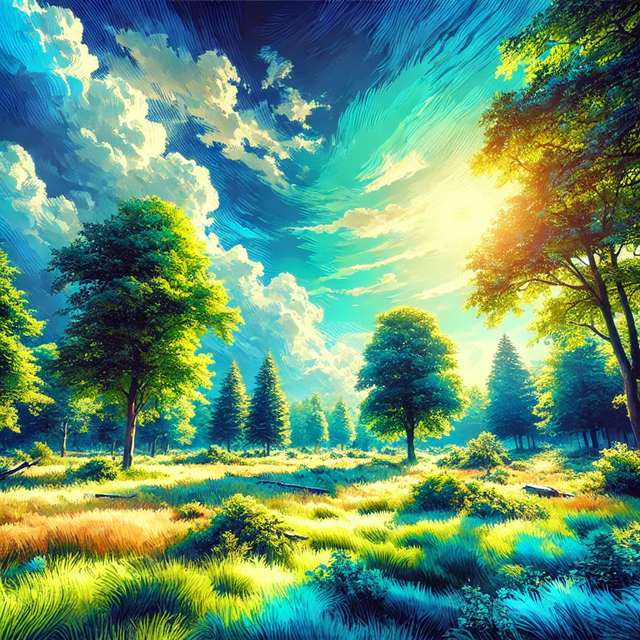

In [3]:
nature_png =  read_image_from_url("https://i.ibb.co/JvWGDgJ/q1.png", cv2.IMREAD_UNCHANGED)
cv2_imshow(nature_png)

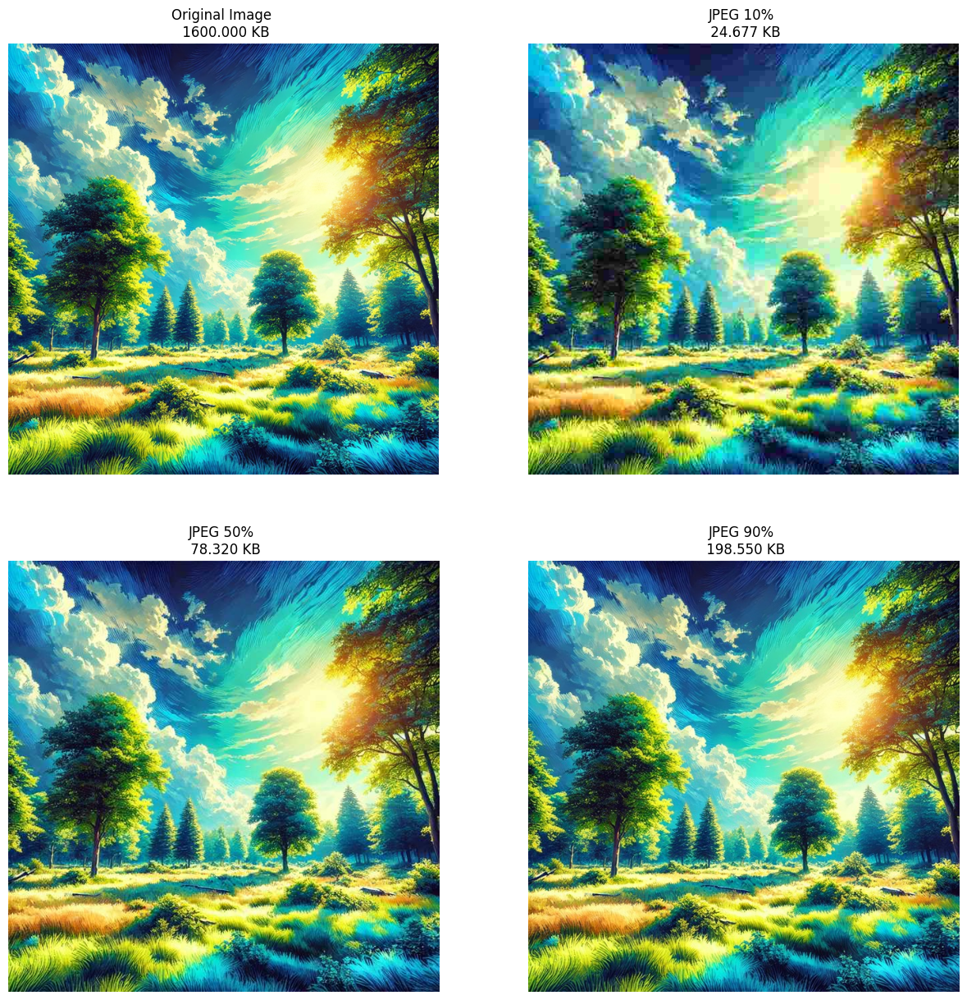

In [4]:
#TODO Fill here
quality_levels = [10, 50, 90]
comp_images = []

for quality in quality_levels:
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
    _, encoded_img = cv2.imencode('.jpg', nature_png, encode_param)
    img_size = encoded_img.nbytes
    img_name = f'nature_{quality}.jpg'
    with open(img_name, 'wb') as f:
      f.write(encoded_img)
    comp_images.append((img_name, img_size))

plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(nature_png, cv2.COLOR_BGR2RGB))
plt.title(f'Original Image \n {nature_png.nbytes / 1024:.3f} KB')
plt.axis('off')

for idx, (name, size) in enumerate(comp_images):
    img = cv2.imread(name)
    plt.subplot(2, 2, idx + 2)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'JPEG {quality_levels[idx]}% \n {size / 1024:.3f} KB')
    plt.axis('off')

plt.show()

<hr>
<font face="B Mitra" size=4>
<div dir=rtl>


<p><font size = 5><b>تمرین ۱: بخش دوم</b></font></p>

فرض کنید می‌خواهید چندین فایل تصویری را در یک فایل ذخیره کنید. از چه فرمتی استفاده خواهید کرد؟ به عنوان مثال،
فرض کنید می‌خواهید تصویر سر و بدن یک نفر را در قالب یک فایل برای فردی بفرستید. تصاویر مربوطه برای شما در متغیرهای head و body ذخیره شده‌ند. فایل نهایی را در فرمت مناسب تولید کنید و به همراه فایل نوت‌بوک آپلود کنید.

</font>

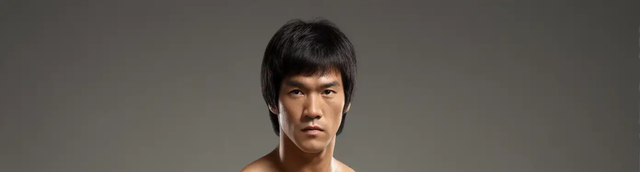

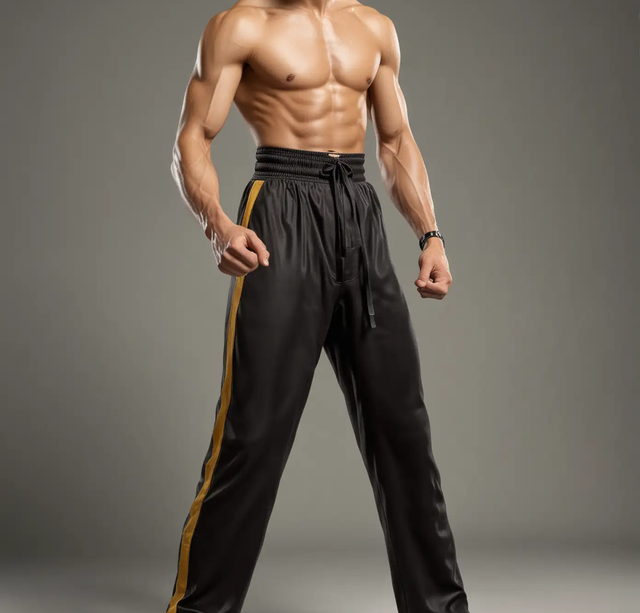

In [ ]:
head = read_image_from_url('https://i.ibb.co/gzKqcn7/head.png', cv2.IMREAD_UNCHANGED)
body = read_image_from_url("https://i.ibb.co/FB5HGvR/body.png", cv2.IMREAD_UNCHANGED)

cv2_imshow(head)
cv2_imshow(body)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

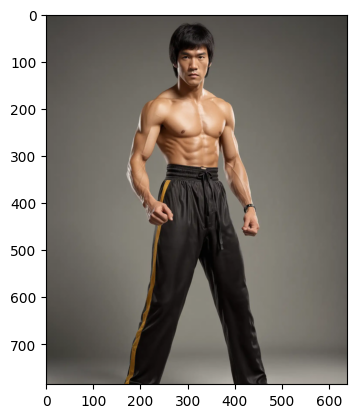

In [ ]:
#TODO Fill here
body_img_resized = cv2.resize(body, (head.shape[1], int(body.shape[0] * head.shape[1] / body.shape[1])))

combined_img = np.vstack((head, body_img_resized))
combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)

combined_img_pil = Image.fromarray(combined_img)
combined_img_pil.save('Bruce_Lee_image.tiff')

files.download('Bruce_Lee_image.tiff')

plt.imshow(combined_img_pil)
plt.show()

<hr>
<font face="B Mitra" size=4>
<div dir=rtl>


<p><font size = 5><b>تمرین ۱: بخش سوم</b></font></p>

فرض کنید یک فایل تصویری بصورت گیف دارید و میخواهید فریم های آن را استخراج و بصورت فایل های PNG ذخیره کنید. پس از اجرای سلول زیر(به کدهای داخل آن توجه نکنید)،یک فایل به نام giphy.gif برای شما ایجاد می شود. هر 10 فریم یک بار تصویر استخراج شده را نمایش دهید.
<br>
<font color='red'>
می‌توانید از ماژول Image از کتابخانه PIL برای این کار استفاده کنید.
</font>
</font>

Downloading...
From: https://i.ibb.co/5nfCpvz/giphy.gif
To: /content/giphy.gif
100%|██████████| 1.38M/1.38M [00:00<00:00, 5.82MB/s]


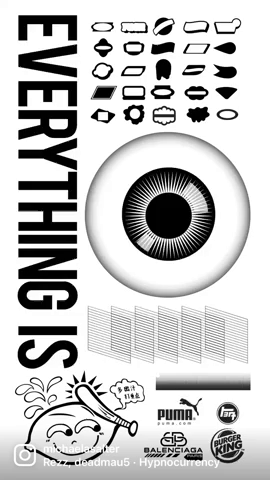

In [ ]:
!pip install gdown
import gdown
from IPython.display import display
from IPython.display import Image as IM

url = f"https://i.ibb.co/5nfCpvz/giphy.gif"
gdown.download(url, 'giphy.gif')

gif_path = "/content/giphy.gif"
display(IM(filename=gif_path))

Total Frames: 81


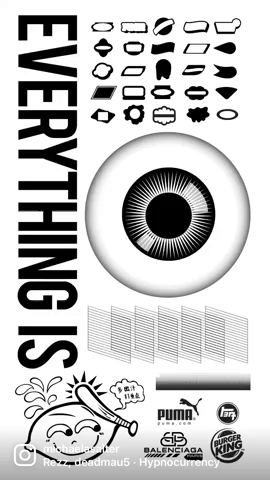

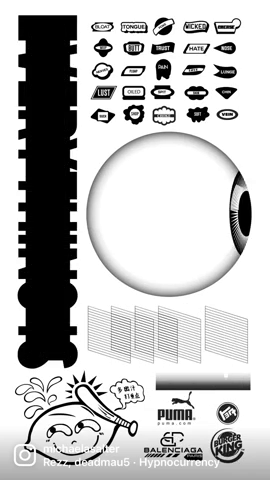

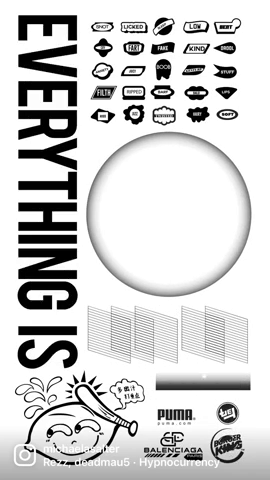

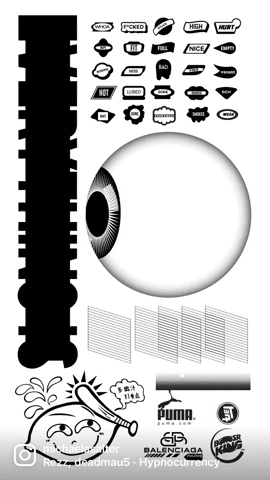

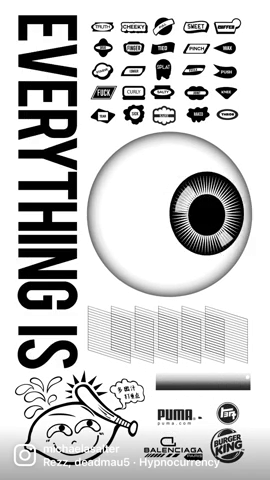

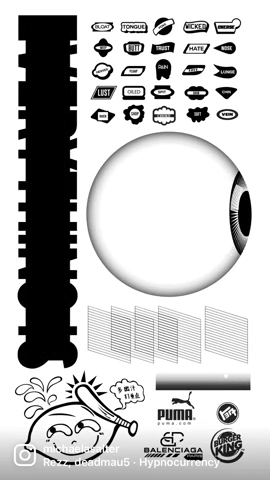

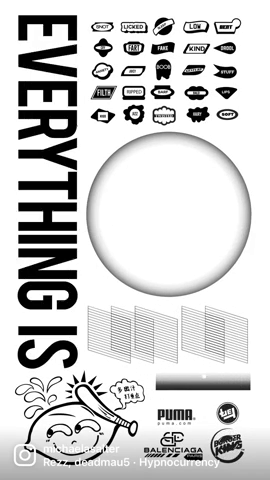

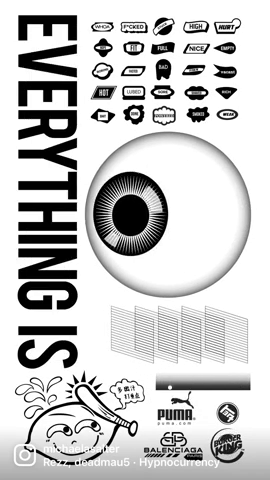

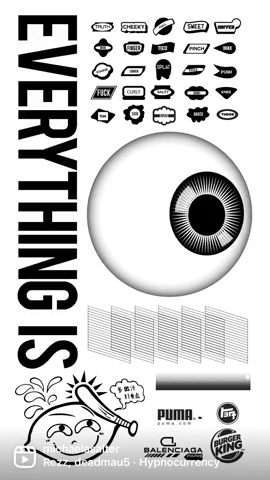

In [ ]:
#TODO Fill here
with Image.open(gif_path) as gif:
    print(f'Total Frames: {gif.n_frames}')
    for frame_number in range(gif.n_frames):
        gif.seek(frame_number)
        frame = gif.copy()
        frame_path = f'frame_{frame_number}.png'
        frame.save(frame_path, 'PNG')

        if frame_number % 10 == 0:
            cv2_imshow(cv2.imread(frame_path))

<hr>
<font face="B Mitra">
<div dir=rtl>
<font size = 5>
<b>تمرین 2</b>
</font>


<div dir=rtl>

<p>
<font size =
>
واترمارکینگ (Watermarking) فرآیند درج اطلاعات یا نشانه‌ها در یک تصویر، ویدئو یا صدا به‌منظور شناسایی مالکیت یا جلوگیری از کپی‌برداری است. این تکنیک در زمینه‌های مختلفی از جمله حقوق مالکیت معنوی، حفاظت از تصاویر و ایجاد هویت برند کاربرد دارد.
<br>
در این تمرین باید تابعی بنویسید که به طور کلی با دریافت یک تصویر بک‌گراند و یک تصویر لیبل، فرآیند واترمارکینگ را انجام دهد.
<lo>
<li>
 طول تصویر لیبل باید با حفظ Aspect reatio به 10 درصد طول تصویر بک‌گراند برسد.
</li>
<li>
شفافیت لیبل باید به 30 درصد مقدار فعلی کاهش یابد.
</li>
<li>
لیبل‌ها باید با فاصله 20 پیکسلی از یک‌دیگر تکرار شوند.(هم در راستا طول و هم در راستا عرض)

خروجی مورد انتظار برای تصاویری که در بلاک زیر قرار دارند:
</font>
<div style="display: flex; justify-content: center;">
<img src="https://i.ibb.co/y0S9dLW/download-1.png" />
</div>
</p>

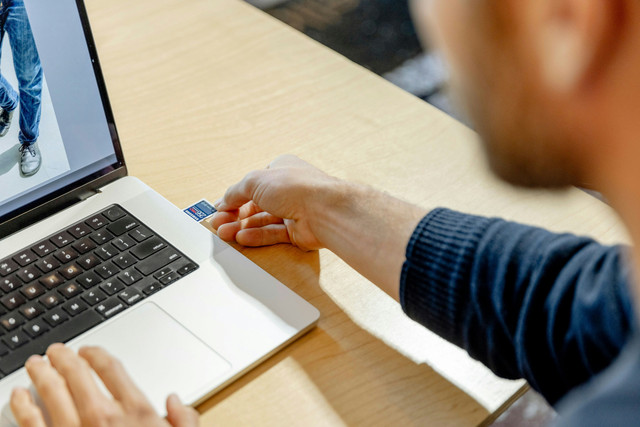

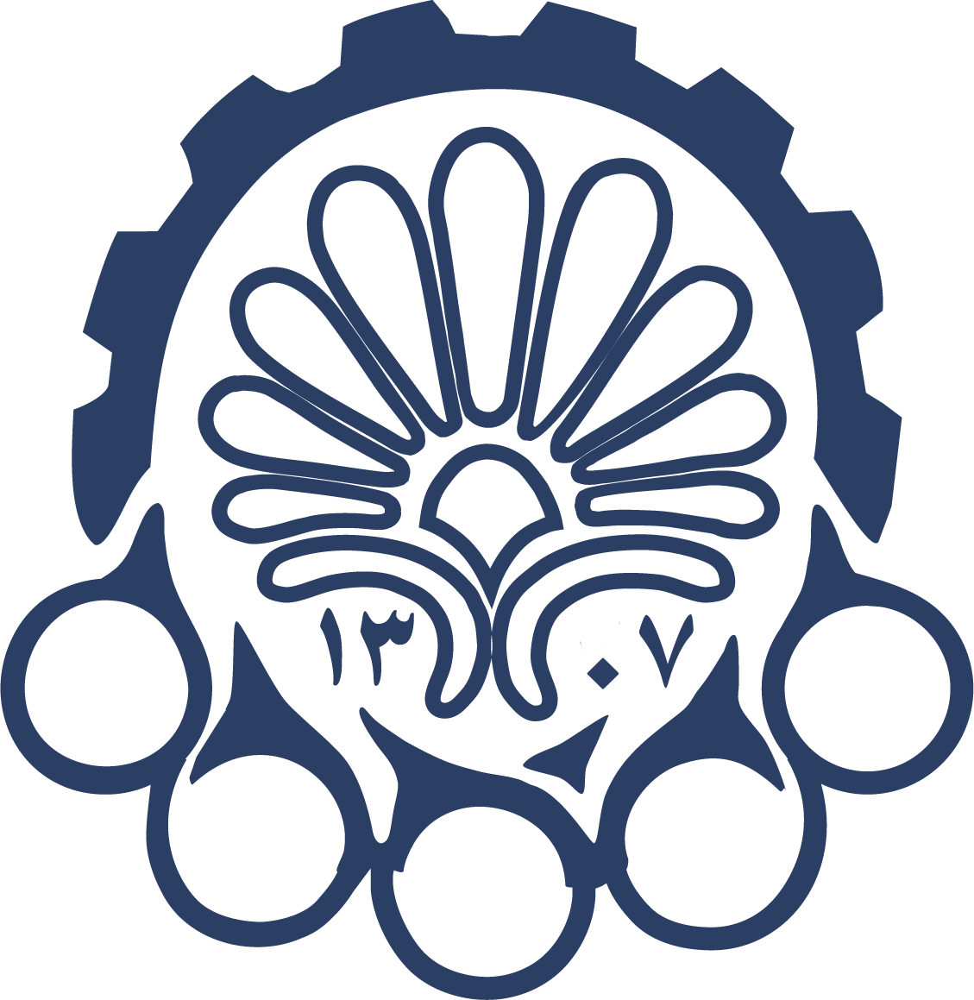

In [15]:
backgr = read_image_from_url("https://i.ibb.co/3YXKf1R/q4.jpg")
label = read_image_from_url("https://i.ibb.co/9bDQ3XB/logo-fa.png", cv2.IMREAD_UNCHANGED)

cv2_imshow(backgr)
cv2_imshow(label)

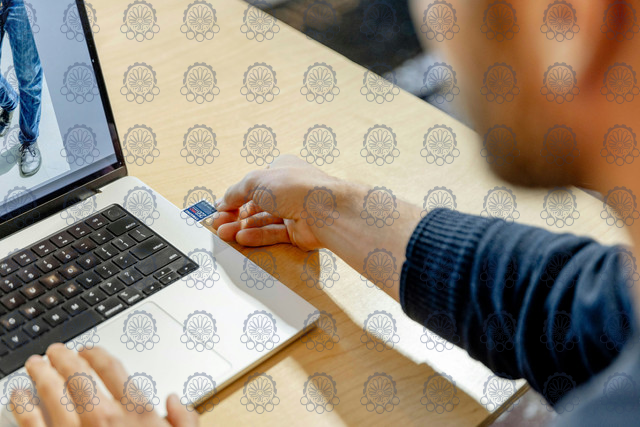

In [16]:
#TODO Fill here
def add_watermark(background, label, transparency):
    result = background.copy()
    backgr_height, backgr_width = result.shape[:2]
    label_height, label_width = label.shape[:2]

    aspect_ratio = label_width / label_height
    new_label_height = int(0.1 * backgr_height)
    new_label_width = int(new_label_height * aspect_ratio)
    resized_label = cv2.resize(label, (new_label_width, new_label_height), interpolation=cv2.INTER_AREA)

    bgr_label = resized_label[:, :, :3]
    alpha_channel = (resized_label[:, :, 3] * transparency).astype(np.uint8)

    for y in range(0, backgr_height, new_label_height + 20):
        for x in range(0, backgr_width, new_label_width + 20):
            y1, y2 = y, y + new_label_height
            x1, x2 = x, x + new_label_width

            if y2 <= backgr_height and x2 <= backgr_width:
                roi = result[y1:y2, x1:x2]
                overlay = bgr_label.copy()
                mask = alpha_channel.copy()
                for c in range(3):
                    roi[:, :, c] = roi[:, :, c] * (1 - mask / 255.0) + overlay[:, :, c] * (mask / 255.0)
                result[y1:y2, x1:x2] = roi

    return result

watermarked_image = add_watermark(backgr, label, 0.3)
cv2_imshow(watermarked_image)

<hr>
<div dir=rtl>
<font face="B Mitra" size=5>
<b>تمرین 3</b>

<div dir=rtl>

<p>
<font size = 4>
Image Morphing یا تغییر شکل تصویر، فرآیند تدریجی انتقال یک تصویر به تصویر دیگری است. این تکنیک معمولاً برای ایجاد انیمیشن‌های جذاب یا ترکیب تصاویر مختلف استفاده می‌شود.
<br>
شما باید تصاویر day و night را که در متغیر های مربوط به خود ذخیره شده اند بهم متصل کرده و یک انیمیشن بصورت فایل gif ایجاد کنید که بطور تدریجی یکی از تصاویر به تصویر دیگر تغییر شکل دهد. این انیمیشن باید شامل حداقل 30 فریم باشد که هر کدام نمایانگر حالت های مختلف بین دو تصویر است. فایل گیف باید به صورت لوپ باشد و پس از تمام فریم‌ها، از ابتدا دوباره نمایش داده شود. همچنین فریم وسط را هم به طور جداگانه نمایش دهید.
<br>
<font color='red'>
عمل Morphing به صورت حرفه‌ای در اینجا مدنظر نمی‌باشد و کافی است تصاویر را با نسبت‌های مختلف با یک دیگر ترکیب کنید.
</font>
</font>
</p>

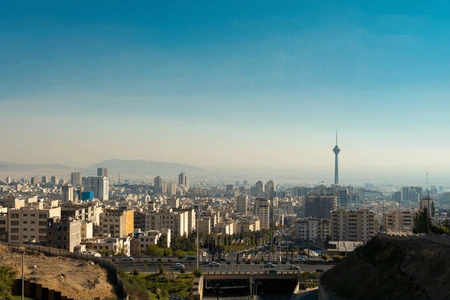

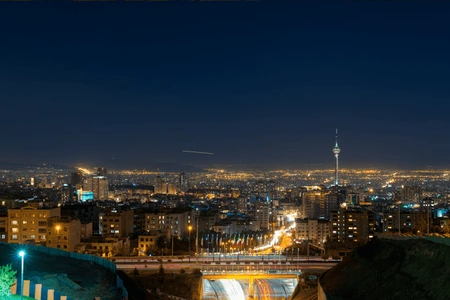

In [ ]:
day = read_image_from_url("https://i.ibb.co/jLm3RZs/tehran-day.png")
night = read_image_from_url("https://i.ibb.co/TMQMBxd/tehran-night.png")

cv2_imshow(day)
cv2_imshow(night)

Display the Gif:


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

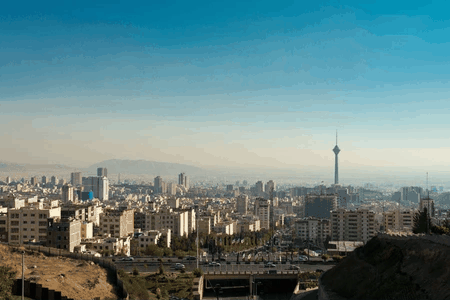

Display the Middle Frame:


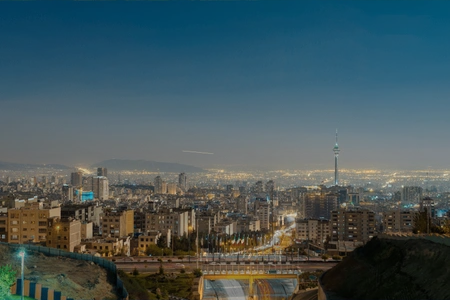

In [ ]:
#TODO Fill here
def morph_images(image_1, image_2, frames_number):
    result_frames = []
    for i in range(frames_number):
        alpha = i / float(frames_number - 1)
        beta = 1.0 - alpha
        morphed_img = cv2.addWeighted(image_1, beta, image_2, alpha, 0)
        result_frames.append(morphed_img)
    return result_frames

morphed_frames = morph_images(day, night, 30)

gif_result = []
for morphed_frame in morphed_frames:
    gif_result.append(Image.fromarray(cv2.cvtColor(morphed_frame, cv2.COLOR_BGR2RGB)))

gif_path = 'day_to_night.gif'
gif_result[0].save(gif_path, save_all=True, append_images=gif_result[1:], loop=0, duration=100)

print('Display the Gif:')
files.download(gif_path)
display(IM(filename=gif_path))
print('Display the Middle Frame:')
cv2_imshow(morphed_frames[15])

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<p></p>
<font size = 5>
<b>Downsampling</b>
</font>

<p>
<font size=4>
یکی از راه‌های ساده برای فشرده‌سازی تصاویر و کاهش حجم‌ آن‌ها استفاده از روش downsampling است.

downsampling در فشرده‌سازی تصویر، فرآیند کاهش تعداد پیکسل‌های یک تصویر برای برای ذخیره‌سازی با حجم کمتر و انتقال سریع‌تر است. این تکنیک، که منجر به از دست‌رفتن جزئیات می‌شود، شامل میانگین‌گیری یا دور انداختن پیکسل‌ها است و می‌تواند منجر به کاهش کیفیت تصویر شود، به‌ویژه اگر تصویر پس از فشرده‌سازی دوباره به سایز اصلی ریسایز شود.<br/> انتخاب تعداد کمتری پیکسل در عین حفظ کیفیت بصری چالشی است که در این الگوریتم‌ها باید با آن دست و پنجه نرم کرد.
</font>
</p>

<font face="B Mitra">
<div dir=rtl>
<font size = 5>
<b>تمرین 4</b>
</font>
<div dir=rtl>

<p>
<font size = 4>
دو روش حذف پیکسل و میانگین‌گیری برای Dowmsampling را پیاده سازی کنید.
<br>
<font color='red'>
از توابع آماده کتابخانه OpenCV استفاده نکنید.
</font>
</p>

In [71]:
def delete_pixel_downsample(image, scale_factor):
    #TODO Fill here
    return image[::scale_factor, ::scale_factor]

In [72]:
def mean_downsample(image, scale_factor):
    #TODO Fill here
    height, width = image.shape
    new_height, new_width = height // scale_factor, width // scale_factor

    downsampled_image = np.zeros((new_height, new_width), dtype=image.dtype)

    for i in range(new_height):
        for j in range(new_width):
            downsampled_image[i, j] = np.mean(image[i*scale_factor:(i+1)*scale_factor, j*scale_factor:(j+1)*scale_factor])

    return downsampled_image

<font face="B Mitra">
<div dir=rtl>

<p>
<font size = 4>
 حال با Scale factor 10 تصویر زیر را Downsample کنید.
(ابعاد تصویر باید یک دهم شوند)
<br>
سپس دو تصویر حاصل از Downsampling را در کنار هم نمایش دهید.
</font>
</p>

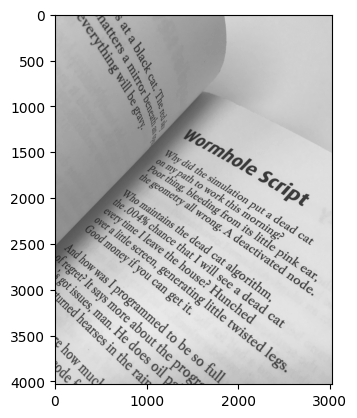

In [73]:
img = read_image_from_url('https://i.ibb.co/2d4Kt0P/book.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(img, cmap='gray')
plt.show()

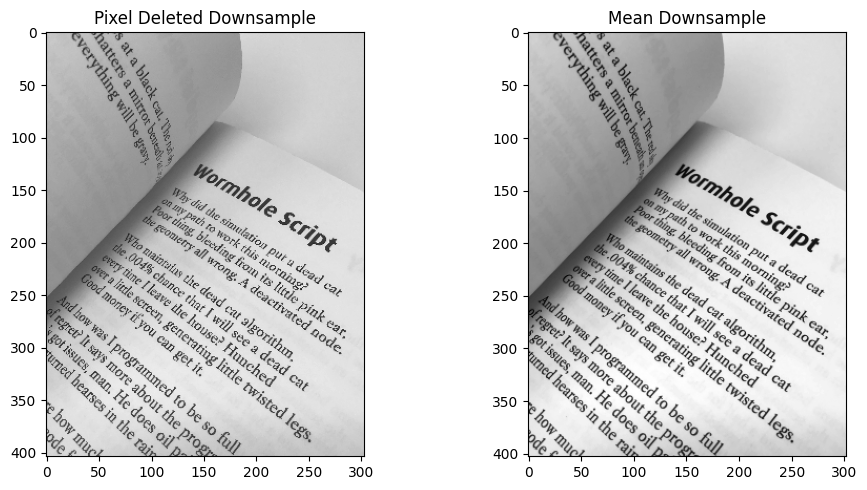

In [74]:
#TODO Fill here
downsampled_delete_pixel = delete_pixel_downsample(img, scale_factor = 10)
downsampled_mean = mean_downsample(img, scale_factor = 10)

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title('Pixel Deleted Downsample')
plt.imshow(downsampled_delete_pixel, cmap='gray')

plt.subplot(1,2,2)
plt.title('Mean Downsample')
plt.imshow(downsampled_mean, cmap='gray')

plt.tight_layout()
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>
<p>
<font size=4, color='lightgreen'>
خروجی دو روش را مقایسه کنید. به نظر شما کدام روش مناسب تر است؟ چرا؟
</p>
</div>
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
در اینجا به وضوح دیده می‌شود که خروجی روش میانگین‌گیری بهتر از خروجی روش حذف پیکسل است.
<br>
در مقایسه این دو روش Downsampling، روش حذف پیکسل  سریع و ساده است، اما می‌تواند منجر به کاهش کیفیت و از دست رفتن جزئیات و اطلاعات مهم تصویر شود. در این روش نتیجه ممکن است حاوی ناهنجاری‌ها و نویز باشد، زیرا هیچ میانگینی از پیکسل‌های اطراف گرفته نمی‌شود.
<br>
روش میانگین‌گیری به مراتب بهتر عمل می‌کند. در این روش بلوک‌های پیکسل جمع‌آوری شده و میانگین رنگ آن‌ها محاسبه می‌شود، که باعث می‌شود تصویر نهایی با کیفیت‌تر باشد. این روش جزئیات و ساختار تصویر را بهتر حفظ می‌کند، اما به لحاظ محاسباتی کمی کندتر است.
<br>
بنابراین به طور کلی، روش میانگین‌گیری برای کاهش اندازه تصویر مناسب‌تر است، زیرا دقت و وضوح تصویر را بیش‌تر حفظ می‌کند. در حالی که روش حذف پیکسل می‌تواند در برخی موارد مانند ضرورت نمایش سریع تصویر کاربردی باشد، اما به دلیل کاهش کیفیت، معمولاً گزینه مناسبی نیست. از نظر کیفیت تصویر، میانگین‌گیری به طور کلی گزینه بهتری است.
</p>
</font>
</div>

<font face="B Mitra">
<div dir=rtl>

<p>
<font size = 4>
در ادامه می‌خواهیم با Upsampling تصویر حاصل از روش میانگین‌گیری را به اندازه اصلی برگردانیم.
برای Upsampling از سه درونیاب nearest neighborhood , bilinear, bicubic استفاده خواهیم کرد.
با استفاده از کتابخانه OpenCV می‌توانید این عملیات را انجام دهید.

</font>
</p>

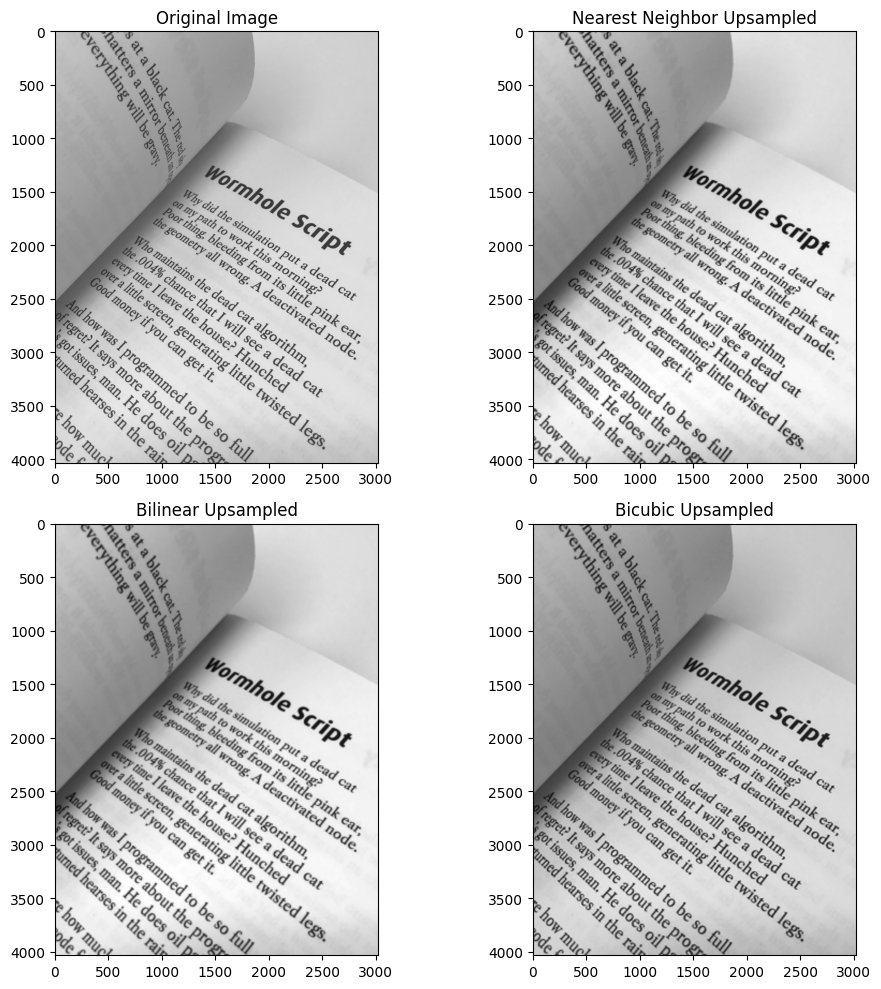

In [75]:
#TODO Fill here
org_height, org_width = img.shape
upsampled_nn = cv2.resize(downsampled_mean, (org_width, org_height), interpolation=cv2.INTER_NEAREST)
upsampled_bl = cv2.resize(downsampled_mean, (org_width, org_height), interpolation=cv2.INTER_LINEAR)
upsampled_bc = cv2.resize(downsampled_mean, (org_width, org_height), interpolation=cv2.INTER_CUBIC)

plt.figure(figsize=(10,10))

plt.subplot(2,2,1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')

plt.subplot(2,2,2)
plt.title('Nearest Neighbor Upsampled')
plt.imshow(upsampled_nn, cmap='gray')

plt.subplot(2,2,3)
plt.title('Bilinear Upsampled')
plt.imshow(upsampled_bl, cmap='gray')

plt.subplot(2,2,4)
plt.title('Bicubic Upsampled')
plt.imshow(upsampled_bc, cmap='gray')

plt.tight_layout()
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>
<p>
<font size=4, color='lightgreen'>
خروجی سه روش را مقایسه کنید. خروجی کدام روش دارای تفاوت بیشتری می‌باشد؟ چرا؟
</p>
</div>
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
در اینجا به نظر می‌رسد که خروجی دو روش Nearest Neighbor و Bilinear با تصویر اصلی تفاوت بیش‌تری نسبت به خروجی روش Bicubic دارند؛ به بیانی دیگر بهترین خروجی مربوط به روش Bicubic است.
<br>
روش Nearest Neighbor به سادگی هر پیکسل جدید را با نزدیک‌ترین پیکسل موجود در تصویر اصلی پر می‌کند. بنابراین، نتیجه معمولاً حاوی ناهنجاری‌ها و لبه‌های تیز است و پیکسل‌هایی در نواحی با تغییرات ناگهانی قابل مشاهده هستند. پس این روش با وجود سریع‌تر بودن کیفیت پایین‌تر و جزئیات کمتری نسبت به روش‌های دیگر دارد.
<br>
روش Bilinear از میانگین وزنی چهار پیکسل نزدیک برای تخمین مقدار پیکسل جدید استفاده می‌کند، پس نتیجه بهتر و صاف‌تراز روش Nearest Neighbor است و لبه‌ها ملایم‌تر و ناهنجاری‌ها کم‌تر می‌باشد. کیفیت خروجی این روش با اینکه بالاتر است، اما هنوز ممکن است کمی جزئیات را از بین ببرد و کمی حالت بلوری داشته باشد.
<br>
روش Bicubic از 16 پیکسل نزدیک برای محاسبه مقدار پیکسل جدید استفاده می‌کند و به رابطه بین پیکسل‌ها توجه بیشتری دارد. پس این روش بهترین نتیجه از لحاظ کیفیت تصویر را دارد؛ تصویر خروجی واضح و با بافت بهتر است و لبه‌ها و جزئیات بیش‌تر حفظ می‌شوند.
</p>
</font>
</div>

<font face="B Mitra">
<div dir=rtl>

<p>
<font size = 4>
در ادامه برای بررسی بیشتر روش‌ها باید تفاوت عکس اصلی و عکس حاصل از Upsampling  در هر روش را محاسبه کنید.
 تصویر تفاوت‌هایی که بدست می‌اید را در کنار یک دیگر نمایش دهید.<br>
همچنین میانگین مقدار تفاوت‌ها را برای هر روش محاسبه کنید.

</font>
</p>

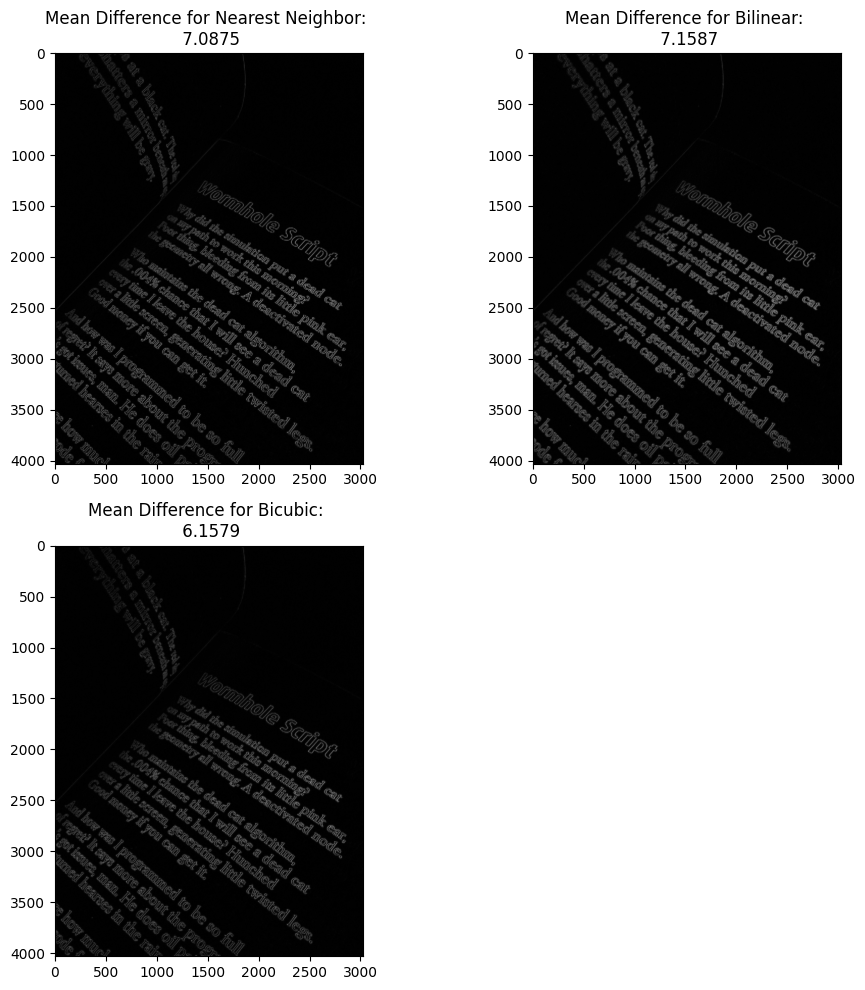

In [76]:
#TODO Fill here
diff_nn = cv2.absdiff(img, upsampled_nn)
diff_bl = cv2.absdiff(img, upsampled_bl)
diff_bc = cv2.absdiff(img, upsampled_bc)

mean_diff_nn = np.mean(diff_nn)
mean_diff_bl = np.mean(diff_bl)
mean_diff_bc = np.mean(diff_bc)

# print(f'Mean Difference for Nearest Neighbor: {mean_diff_nn:.4f}')
# print(f'Mean Difference for Bilinear: {mean_diff_bl:.4f}')
# print(f'Mean Difference for Bicubic: {mean_diff_bc:.4f}')

plt.figure(figsize=(10, 10))

plt.subplot(2,2,1)
plt.title(f'Mean Difference for Nearest Neighbor: \n {mean_diff_nn:.4f}')
plt.imshow(diff_nn, cmap='gray')

plt.subplot(2,2,2)
plt.title(f'Mean Difference for Bilinear: \n {mean_diff_bl:.4f}')
plt.imshow(diff_bl, cmap='gray')

plt.subplot(2,2,3)
plt.title(f'Mean Difference for Bicubic: \n {mean_diff_bc:.4f}')
plt.imshow(diff_bc, cmap='gray')

plt.tight_layout()
plt.show()

<font face="B Mitra" size=5>
<div dir=rtl>
<p>
<font size=4, color='lightgreen'>
برداشت خود را از نتایج بدست آمده بیان کنید.
</p>
</div>
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
تصویر تفاوت روش‌های Nearest Neighbor و Bilinear نسبت به تصویر تفاوت روش Bicubic دارای نواحی واضح‌تر و لبه‌های تیزتر و ناهنجاری بیش‌تری هستند در حالی که تصویر تفاوت روش Bicubic متعادل‌تر است. این بدان معناست که دو روش اول خروجی متفاوت‌تری نسبت به روش سوم دارند و روش Bicubic در بین این سه روش، بهترین خروجی و بهترین کیفیت را داراست و به همین دلیل تصویر تفاوت آن با تصویر اصلی، وضوح کم‌تری دارد و مقادیر پیکسل‌ها در این تصویر تفاوت کم‌تر و تصویر تیره‌تر است. همچنین این نتیجه از روی عدد میانگین تفاوت‌ها نیز برداشت می‌شود. عدد میانگین تفاوت روش‌های Nearest Neighbor و Bilinear و Bicubic به ترتیب برابر 7.0875، 7.1587 و 6.1579 است که واضح است بیشترین تفاوت مربوط به روش Bilinear (که البته فقط کمی بدتر از روش Nearest Neighbor است) و کم‌ترین تفاوت مربوط به روش Bicubic است. پس در کل روش Bicubic به ما تصویر بهتر و با کیفیت بیش‌تر و تفاوت کم‌تر با تصویر اصلی را خروجی می‌دهد.
</p>
</font>
</div>

<font face="B Mitra">
<div dir=rtl>

<p>
<font size = 4>
در آخر نمودار سه بعدی تصویر به دست آمده از Upsampling را برای هر روش رسم کنید.
<br>
از کتابخانه plotly برای رسم نمودار استفاده کنید.
<br>
<font color='red'>
صرفا نمایش بخش کراپ شده که در بلاک زیر قرار دارد کافی است.
</font>
</font>
</p>

In [77]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

croped_bl = upsampled_bl[2000:2300, 1000:1300]
croped_nn = upsampled_nn[2000:2300, 1000:1300]
croped_bc = upsampled_bc[2000:2300, 1000:1300]

#TODO Fill here
x = np.arange(croped_nn.shape[1])
y = np.arange(croped_nn.shape[0])
x, y = np.meshgrid(x, y)

fig = make_subplots(rows=3, cols=1, specs=[[{'type': 'surface'}], [{'type': 'surface'}], [{'type': 'surface'}]], subplot_titles=("Nearest Neighbor Upsampled", "Bilinear Upsampled", "Bicubic Upsampled"))

fig.add_trace(go.Surface(z=croped_nn, x=x, y=y, colorscale="Viridis", showscale=False), row=1, col=1)
fig.update_traces(contours_z=dict(show=True, usecolormap=True, highlightcolor="limegreen", project_z=True), row=1, col=1)

fig.add_trace(go.Surface(z=croped_bl, x=x, y=y, colorscale="Viridis", showscale=False), row=2, col=1)
fig.update_traces(contours_z=dict(show=True, usecolormap=True, highlightcolor="limegreen", project_z=True), row=2, col=1)

fig.add_trace(go.Surface(z=croped_bc, x=x, y=y, colorscale="Viridis", showscale=False), row=3, col=1)
fig.update_traces(contours_z=dict(show=True, usecolormap=True, highlightcolor="limegreen", project_z=True), row=3, col=1)

fig.update_layout(height=1200, width=1000)
fig.show()

<font face="B Mitra" size=5>
<div dir=rtl>
<p>
<font size=4, color='lightgreen'>
با توجه به جزوه و مطالبی که یادگرفته‌اید خروجی‌ها را تحلیل کنید.
</p>
</div>
</font>

<div dir=rtl>
<p>
<font face="B Mitra" size=5, color='cyan'>
از آنجا که روش Nearest Neighbor از نزدیک‌ترین پیکسل‌ها برای بزرگ‌نمایی استفاده می‌کند، نمودار سه بعدی تصویر حاصل دارای لبه‌های پله‌ای و خشن و مکعب‌های ناهموار است و تغییرات بعضی از پیکسل‌های ناگهانی و شدید است، پس در نتیجه وضوح تصویر کاهش می‌یابد.
<br>
از آنجا که روش Bilinear  از میانگین وزن‌دار پیکسل‌های اطراف برای محاسبه مقادیر جدید استفاده می‌کند، نمودار سه‌بعدی تصویر حاصل نرم‌تر و یکنواخت‌تر از روش Nearest Neighbor است و لبه‌ها کمتر پله‌ای به نظر می‌رسند و سطوح به صورت پیوسته‌تری تغییر می‌کنند و الگوهای مرزی به خوبی حفظ می‌شوند. پس کیفیت بصری بالاتر است، اما همچنان می‌تواند ناهنجاری‌هایی داشته باشد.
<br>
از آنجا که روش Bicubic از مقادیر بیشتری از پیکسل‌های اطراف برای محاسبه مقادیر جدید استفاده می‌کند، نمودار سه‌بعدی تصویر حاصل بسیار نرم‌تر و باکیفیت‌تر از دو روش قبلی است و لبه‌ها صاف و طبیعی به نظر می‌رسند و سطوح به صورت روان و پیوسته دیده می‌شوند، در نتیجه این روش بهترین کیفیت خروجی را دارد.
</div>

<hr>
<font face="B Mitra">
<div dir=rtl>
<font size = 5>
<b>تمرین 5</b>
</font>
<div dir=rtl>

<p>
<font size = 4>
در این تمرین قصد داریم حروف متن درون تصویر را مشخص کنیم. نیاز است که دور هر کارکتر درون تصویر یک مستطیل رسم شود.
<br>
<font color='red'>
تنها از کتابخانه Numpy می‌توانید استفاده کنید.
</font>
<br>
خروجی مورد انتظار:
</font>
</p>
<p style="text-align:center;"><img src='https://i.ibb.co/xq2mGTQ/ocr.png'></p>

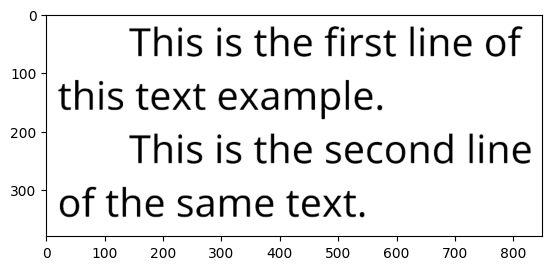

In [94]:
text_img = read_image_from_url("https://i.ibb.co/DKK5rgY/text.png")
plt.imshow(text_img)
plt.show()

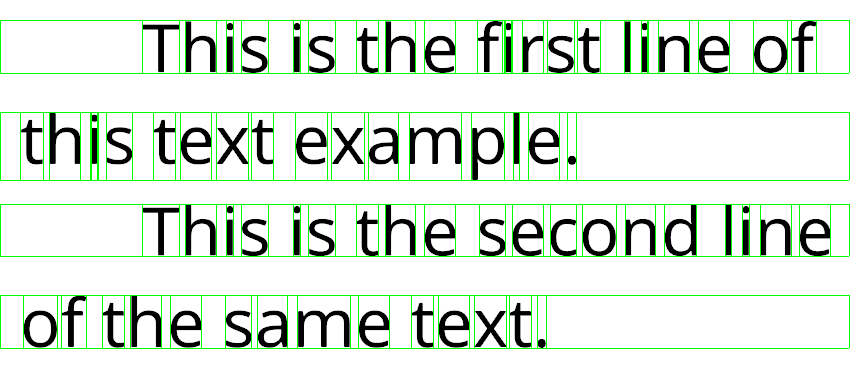

In [95]:
def draw_rectangle(image, top_left, bottom_right, color):
    image[top_left[1]:bottom_right[1], top_left[0]] = color
    image[top_left[1]:bottom_right[1], bottom_right[0]] = color
    image[top_left[1], top_left[0]:bottom_right[0]] = color
    image[bottom_right[1], top_left[0]:bottom_right[0]] = color

def find_contours(binary_image):
    img_copy = binary_image.copy()
    contours = []
    for i in range(1, img_copy.shape[0]-1):
        for j in range(1, img_copy.shape[1]-1):
            if img_copy[i, j] == 1:
                x, y = j, i
                min_x, min_y = x, y
                max_x, max_y = x, y
                stack = [(x, y)]
                while stack:
                    cx, cy = stack.pop()
                    if img_copy[cy, cx] == 1:
                        img_copy[cy, cx] = 0
                        min_x = min(min_x, cx)
                        max_x = max(max_x, cx)
                        min_y = min(min_y, cy)
                        max_y = max(max_y, cy)
                        for dx in [-1, 0, 1]:
                            for dy in [-1, 0, 1]:
                                nx, ny = cx + dx, cy + dy
                                if 0 <= nx < img_copy.shape[1] and 0 <= ny < img_copy.shape[0]:
                                    stack.append((nx, ny))
                contours.append((min_x, min_y, max_x, max_y))
    return contours

def merge_lines(line_bounds):
    merged_lines = []
    for x_min, y_min, x_max, y_max in sorted(line_bounds, key=lambda x: x[1]):
        if merged_lines and y_min <= merged_lines[-1][3] + 10:
            mx_min, my_min, mx_max, my_max = merged_lines[-1]
            merged_lines[-1] = (min(mx_min, x_min), min(my_min, y_min), max(mx_max, x_max), max(my_max, y_max))
        else:
            merged_lines.append((x_min, y_min, x_max, y_max))
    return merged_lines

gray_image = np.dot(text_img[..., :3], [0.2989, 0.5870, 0.1140])
binary_image = np.where(gray_image > 128, 0, 1).astype(np.uint8)

contours = find_contours(binary_image)
line_bounds = [(x_min, y_min, x_max, y_max) for x_min, y_min, x_max, y_max in contours]
merged_lines = merge_lines(line_bounds)

for (x_min, y_min, x_max, y_max) in merged_lines:
    draw_rectangle(text_img, (0, y_min - 1), (text_img.shape[1] - 1, y_max + 1), [0, 255, 0])

for (x_min, y_min, x_max, y_max) in contours:
    for (lx_min, ly_min, lx_max, ly_max) in merged_lines:
        if ly_min <= y_min <= ly_max:
            draw_rectangle(text_img, (x_min - 1, ly_min - 1), (x_max + 1, ly_max + 1), [0, 255, 0])

cv2_imshow(text_img)